# Market of public catering establishments in Moscow

### Our company is on the verge of opening a completely new type of public institution - a cafe with robotic waiters. The project is promising and today I will conduct a full market analysis and prove that it is worth its investment

## Data

- `id` — object identifier;
- `object_name` — name of the catering facility;
- `chain` - chain restaurant;
- `object_type` - type of catering object;
- `address` — address;
- `number` — number of seats.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

pd.options.display.float_format = '{:.2f}'.format

In [2]:
df = pd.read_csv('/datasets/rest_data.csv')
df

,id,object_name,chain,object_type,address,number
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50
...,...,...,...,...,...,...
15361,208537,Шоколадница,да,кафе,"город Москва, 3-й Крутицкий переулок, дом 18",50
15362,209264,Шоколадница,да,кафе,"город Москва, улица Земляной Вал, дом 33",10
15363,209186,Шоколадница,да,кафе,"город Москва, улица Земляной Вал, дом 33",20
15364,221900,Шоколадница,да,кафе,"город Москва, поселение Московский, Киевское ш...",36


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15366 entries, 0 to 15365
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           15366 non-null  int64 
 1   object_name  15366 non-null  object
 2   chain        15366 non-null  object
 3   object_type  15366 non-null  object
 4   address      15366 non-null  object
 5   number       15366 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 720.4+ KB


In [4]:
df.describe()

,id,number
count,15366.00,15366.00
mean,119720.07,59.55
std,73036.13,74.74
min,838.00,0.00
25%,28524.00,12.00
50%,144974.50,40.00
75%,184262.25,80.00
max,223439.00,1700.00


**Conclusions:**
We looked at the data, so far it looks decent, but we need to look deeper, let's do data preprocessing

## Data preprocessing

First, I want to change the name of the `number` column for personal convenience

In [5]:
df = df.rename(columns={'number':'number_of_seats'})
df.columns

Index(['id', 'object_name', 'chain', 'object_type', 'address',
       'number_of_seats'],
      dtype='object')

Also, I would immediately make lower case in all columns, so it will be easier to perceive

In [6]:
df['object_name'] = df['object_name'].str.lower()
df['object_type'] = df['object_type'].str.lower()
df['address'] = df['address'].str.lower()

In [7]:
df['chain'].unique()

array(['нет', 'да'], dtype=object)

Everything is fine here, despite the fact that the type is not boolean, there are no other values ​​except `no` and `yes`

In [8]:
df['object_type'].unique()

array(['кафе', 'столовая', 'закусочная',
       'предприятие быстрого обслуживания', 'ресторан', 'кафетерий',
       'буфет', 'бар', 'магазин (отдел кулинарии)'], dtype=object)

In [9]:
df['number_of_seats'].describe()

count   15366.00
mean       59.55
std        74.74
min         0.00
25%        12.00
50%        40.00
75%        80.00
max      1700.00
Name: number_of_seats, dtype: float64

Text(0.5, 1.0, 'Number of seats')

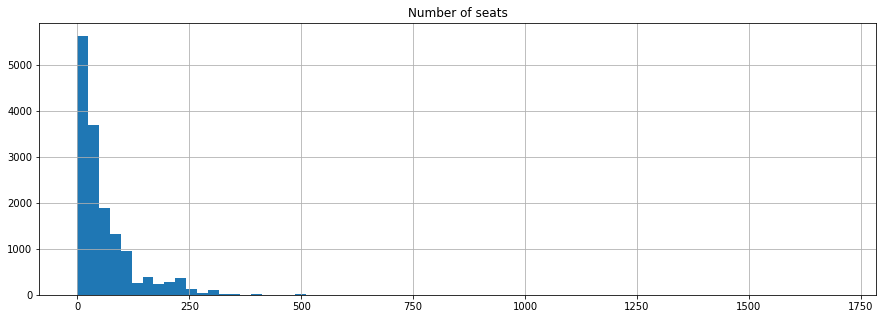

In [10]:
df['number_of_seats'].hist(bins=70, figsize=(15, 5))
plt.title('Number of seats')

In [11]:
without_seats = df[df['number_of_seats'] == 0]
without_seats

,id,object_name,chain,object_type,address,number_of_seats
137,115498,пекарня & донер,нет,закусочная,"город москва, бутырская улица, дом 9, корпус 2",0
154,152556,шаурма в пите,нет,предприятие быстрого обслуживания,"город москва, варшавское шоссе, дом 72, корпус 2",0
157,149568,суши,нет,предприятие быстрого обслуживания,"город москва, улица маршала василевского, дом ...",0
190,126956,"шаурма, куры-гриль",нет,предприятие быстрого обслуживания,"город москва, 1-я владимирская улица, дом 21",0
195,149531,"шаурма, куры-гриль",нет,предприятие быстрого обслуживания,"город москва, 2-я владимирская улица, дом 44/10",0
...,...,...,...,...,...,...
15334,211228,милти,да,магазин (отдел кулинарии),"город москва, дубравная улица, дом 34/29",0
15335,211221,милти,да,магазин (отдел кулинарии),"город москва, пятницкое шоссе, дом 3",0
15336,211209,готовые блюда милти,да,предприятие быстрого обслуживания,"город москва, ореховый бульвар, дом 22а",0
15337,208477,милти,да,предприятие быстрого обслуживания,"город москва, 3-й крутицкий переулок, дом 18",0


In [12]:
without_seats['object_type'].value_counts().sort_values()

столовая                              19
бар                                   28
ресторан                              45
буфет                                 68
кафетерий                            113
магазин (отдел кулинарии)            145
закусочная                           189
кафе                                 310
предприятие быстрого обслуживания    704
Name: object_type, dtype: int64

Text(0.5, 1.0, 'Object type')

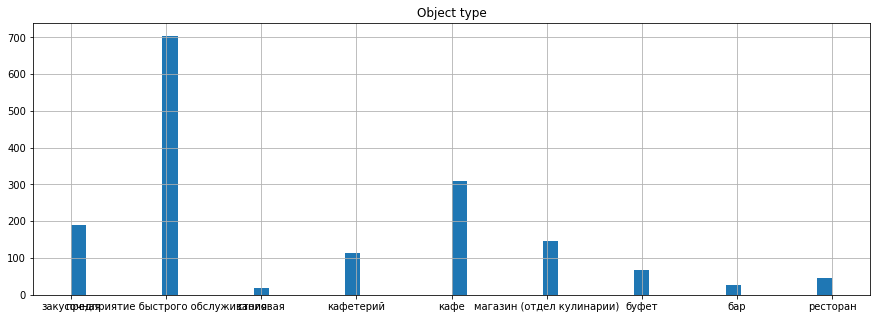

In [13]:
without_seats['object_type'].hist(bins=50, figsize=(15, 5))
plt.title('Object type')

Hmmm, a suspiciously large number of establishments that do not have a single chair. Most establishments without chairs are fast food establishments. I assume that these are tents standing on the street, or something like shawarma - everything goes quickly and conveniently there to eat on the go. So let's leave them as they are.

In [14]:
df.duplicated().sum()

0

In [15]:
df['address'].value_counts()

город москва, ходынский бульвар, дом 4                95
город москва, пресненская набережная, дом 2           63
город москва, проспект мира, дом 211, корпус 2        60
город москва, кировоградская улица, дом 13а           53
город москва, площадь киевского вокзала, дом 2        48
                                                      ..
город москва, улица александра солженицына, дом 46     1
город москва, походный проезд, дом 4, корпус 1         1
город москва, пятницкое шоссе, дом 40                  1
город москва, композиторская улица, дом 17             1
город москва, улица цюрупы, дом 4                      1
Name: address, Length: 9108, dtype: int64

In [16]:
df['id'].value_counts().sort_values()

163840    1
161609    1
210341    1
69634     1
208941    1
         ..
217078    1
83959     1
147448    1
141355    1
167934    1
Name: id, Length: 15366, dtype: int64

We didn't find any duplicates. By addresses: for example, at the address `Moscow, khodynsky boulevard, house 4` there are as many as 95 positions, which may seem rather strange. Nevertheless, the largest shopping center `Aviapark` is located at the same address, it is not surprising that there are so many catering establishments there.

## Data analysis

### Explore the ratio of types of public catering facilities by number. Build a graph.

To begin with, let's count the number of seats in the establishments and see which establishments have the most seats

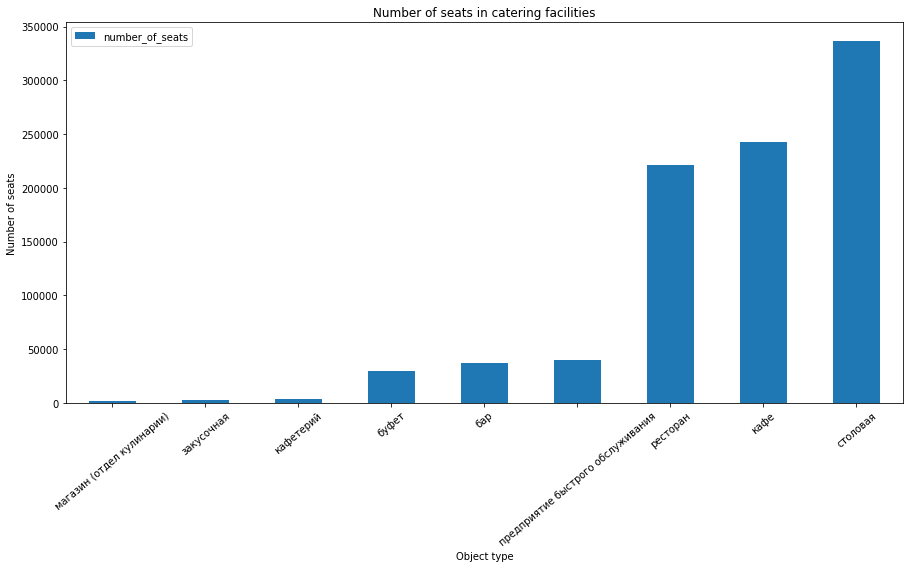

In [18]:
first = df.groupby('object_type').sum().reset_index()
objct = first[['object_type', 'number_of_seats']].set_index('object_type').sort_values('number_of_seats', ascending=True).plot(kind='bar', figsize=(15, 7))
objct.set_xlabel('Object type')
objct.set_ylabel('Number of seats')
objct.set_title('Number of seats in catering facilities')
plt.xticks(rotation=40)
plt.show()

In [19]:
first[['object_type', 'number_of_seats']].sort_values(by='number_of_seats',ascending=False)

,object_type,number_of_seats
8,столовая,336948
3,кафе,242228
7,ресторан,221266
6,предприятие быстрого обслуживания,39522
0,бар,37231
1,буфет,29911
4,кафетерий,3631
2,закусочная,2739
5,магазин (отдел кулинарии),1526


Now let's count the number of catering establishments in Moscow

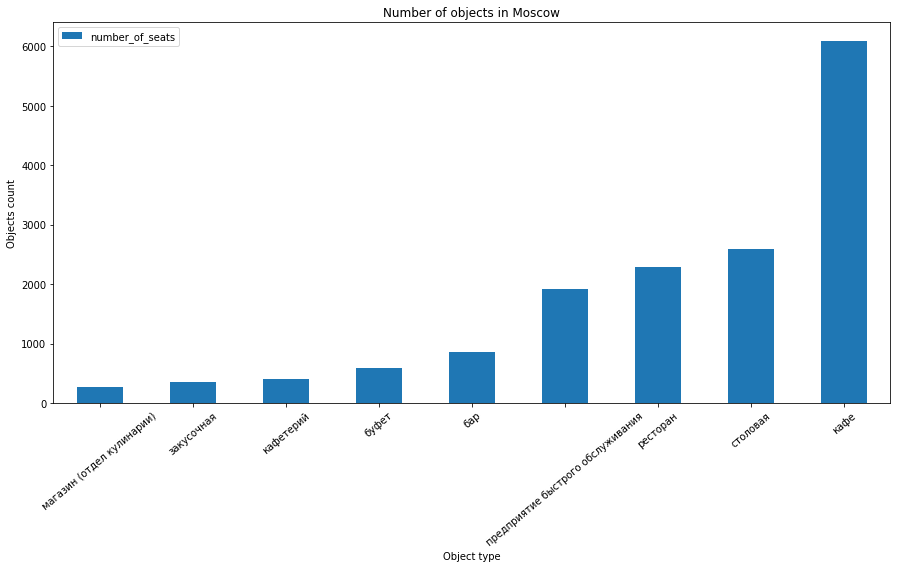

In [21]:
first = df.groupby('object_type').count().reset_index()
seats = first[['object_type', 'number_of_seats']].set_index('object_type').sort_values('number_of_seats', ascending=True).plot(kind='bar', figsize=(15, 7))
seats.set_xlabel('Object type')
seats.set_ylabel('Objects count')
seats.set_title('Number of objects in Moscow')
plt.xticks(rotation=40)
plt.show()

In [22]:
df.groupby('object_type')['object_name'].count().sort_values(ascending=False)

object_type
кафе                                 6099
столовая                             2587
ресторан                             2285
предприятие быстрого обслуживания    1923
бар                                   856
буфет                                 585
кафетерий                             398
закусочная                            360
магазин (отдел кулинарии)             273
Name: object_name, dtype: int64

**Conclusion:**
 
- The largest number of seats is in canteens, which is not surprising: canteens are designed for a large number of people, so there should be as many seats as possible. They are followed by cafes: usually cafes are small establishments, so it is rather strange to see them in the top seats, but if we look at the following graph with the number of establishments themselves, everything falls into place: cafes win not by the number of seats per establishment area, but by the number establishments, even if they are very small. And in third place in terms of the number of seats we have restaurants: restaurants, as a rule, have a fairly large area, so the presence of a large number of seats in them is not surprising.
- In terms of the number of establishments, our cafe is a clear winner. They surpass their closest rivals - canteens - as much as 3 times. Indeed, one can observe how cafes all over the city open almost every day. I can guess why they are so popular: cafes are very versatile - you can drink coffee, work or sit with friends in them without counting a big check. Accordingly, now a cafe is not just a place where you can buy tea or coffee, but also an excellent work or study space that can be found around the corner of every house.

### Explore the ratio of network and non-chain establishments by number. Build a graph.

In [23]:
df.groupby('chain')['object_name'].count().sort_values()

chain
да      2968
нет    12398
Name: object_name, dtype: int64

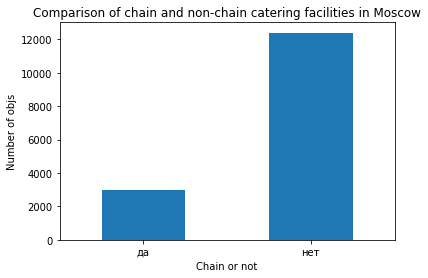

In [24]:
objct = df.groupby('chain')['object_name'].count().plot(kind='bar', figsize=(6,4))
objct.set_xlabel('Chain or not')
objct.set_ylabel('Number of objs')
objct.set_title('Comparison of chain and non-chain catering facilities in Moscow')
plt.xticks(rotation=0)
plt.show()

**Conclusion:**

Unsown objects have an unambiguous predominance - approximately 5.5 times. I think this is due to the fact that now many people are running to open their own cafes, not even counting on making it a network establishment. People put their soul into their cafes, create comfort and delight visitors with really high-quality coffee.

### What type of public catering facility is characterized by network distribution?

In [25]:
chain_ratio = df.pivot_table(index = 'object_type', columns = 'chain', values = 'id', aggfunc = 'count').reset_index()
chain_ratio['ratio'] = chain_ratio['да']/(chain_ratio['да']+chain_ratio['нет'])
chain_ratio

chain,object_type,да,нет,ratio
0,бар,37,819,0.04
1,буфет,11,574,0.02
2,закусочная,56,304,0.16
3,кафе,1396,4703,0.23
4,кафетерий,52,346,0.13
5,магазин (отдел кулинарии),78,195,0.29
6,предприятие быстрого обслуживания,791,1132,0.41
7,ресторан,544,1741,0.24
8,столовая,3,2584,0.00


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'бар'),
  Text(1, 0, 'буфет'),
  Text(2, 0, 'закусочная'),
  Text(3, 0, 'кафе'),
  Text(4, 0, 'кафетерий'),
  Text(5, 0, 'магазин (отдел кулинарии)'),
  Text(6, 0, 'предприятие быстрого обслуживания'),
  Text(7, 0, 'ресторан'),
  Text(8, 0, 'столовая')])

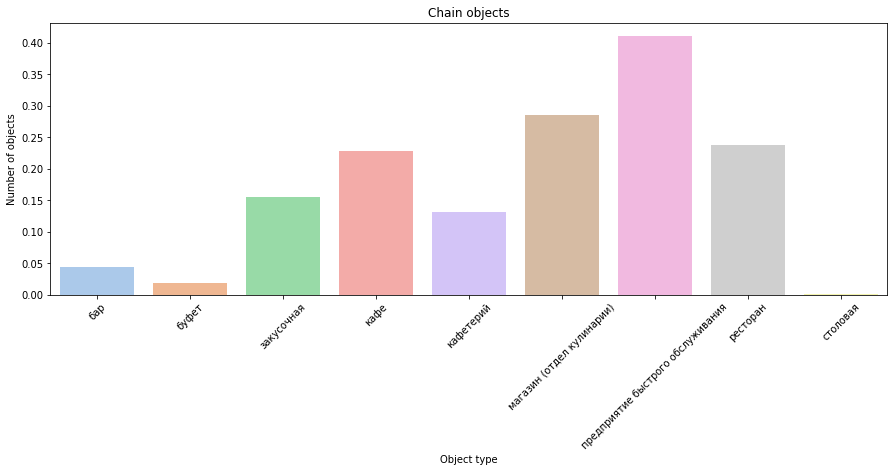

In [26]:
plt.figure(figsize=(15, 5))
net = sns.barplot(x='object_type', y='ratio', data=chain_ratio, palette="pastel")
net.set_xlabel('Object type')
net.set_ylabel('Number of objects')
net.set_title('Chain objects')
plt.xticks(rotation=45)

**Conclusion:**

The most characteristic is the network distribution of public objects in such types of establishments as cafes, fast food and restaurants. Looking at the comparison, the largest number of chain establishments out of the total number of establishments of this type is in fast food establishments. We know very popular chains such as kfc, McDonald's, Burger King, it is obvious that the bulk of the fast food market is filled with them. It is followed by the culinary departments in stores, I think this is also related to chain stores: certain cuisines are made by the same company.

### What is typical for chain establishments: are there many establishments with a small number of seats in each, or few establishments with a large number of seats?

We must now decide how many establishments in the network will be considered large. In my opinion, many establishments will be more than 5. As for the seats, I would use the median value.

In [27]:
df.columns

Index(['id', 'object_name', 'chain', 'object_type', 'address',
       'number_of_seats'],
      dtype='object')

,Num of obects,Median objects,Median num of seats
Group,,,
A lot objects - A lot of seats,69,10,57.18
A lot objects - Little seats,23,13,11.50
Little objects - A lot of seats,349,1,63.00
Little objects - Little seats,136,1,10.00


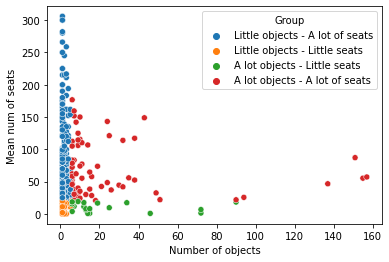

In [30]:
chains = df.query('chain == "да"')
chains = chains.groupby('object_name').agg({'id':'count' , 'number_of_seats':'mean'})

chains['sum_rest'] = 'Little objects'
chains.loc[chains['id'] > 5, 'sum_rest'] = 'A lot objects'

chains['sum_seats'] = 'Little seats'
chains.loc[chains['number_of_seats'] > 20, 'sum_seats'] = 'A lot of seats'

chains['Group'] = chains['sum_rest'].astype(str) + ' - ' + chains['sum_seats'].astype(str)
sns.scatterplot(data = chains, x = 'id', y = 'number_of_seats', hue = 'Group')
plt.xlabel('Number of objects')
plt.ylabel('Mean num of seats')

chains.reset_index().groupby('Group').agg({
    'object_name': 'nunique', 'id': 'median', 'number_of_seats': 'median'
}).rename(columns = {
    'object_name':'Num of obects',
    'id':'Median objects',
    'number_of_seats':'Median num of seats'
})

**Conclusion:**

Definitely `few objects, many seats`.

`Many objects, few seats` occurs 15 times less.

### For each type of catering facility, describe the average number of seats. Which species provides the highest number of seats on average? Build charts.

In [ ]:
plt.figure(figsize=(12, 7))
avg_seats = sns.boxplot(x='number_of_seats', y='object_type', data=df, palette="pastel")
avg_seats.set_xlabel('Number of objects')
avg_seats.set_title('Number of seats')
avg_seats.set_xlim(-5,400)
plt.show()

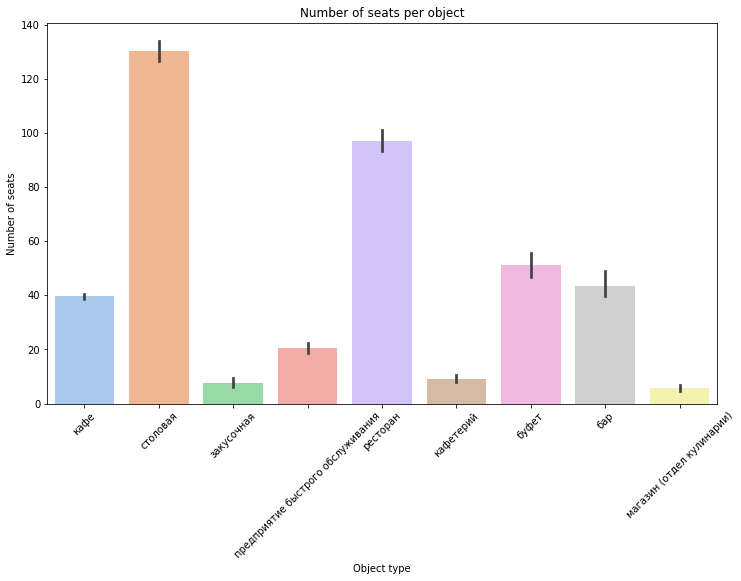

In [31]:
plt.figure(figsize=(12, 7))
avg_seats = sns.barplot(x='object_type', y='number_of_seats', data=df, palette="pastel")
avg_seats.set_xlabel('Object type')
avg_seats.set_ylabel('Number of seats')
avg_seats.set_title('Number of seats per object')
plt.xticks(rotation=45)
plt.show()

In [32]:
df.groupby('object_type')['number_of_seats'].describe().sort_values(by='50%')

,count,mean,std,min,25%,50%,75%,max
object_type,,,,,,,,
закусочная,360.00,7.61,16.65,0.00,0.00,0.00,10.00,216.00
магазин (отдел кулинарии),273.00,5.59,9.87,0.00,0.00,0.00,8.00,50.00
предприятие быстрого обслуживания,1923.00,20.55,38.37,0.00,0.00,5.00,25.00,580.00
кафетерий,398.00,9.12,14.64,0.00,0.00,6.00,12.00,200.00
кафе,6099.00,39.72,37.72,0.00,15.00,30.00,50.00,533.00
буфет,585.00,51.13,56.33,0.00,14.00,32.00,80.00,320.00
бар,856.00,43.49,67.08,0.00,20.00,35.00,50.00,1700.00
ресторан,2285.00,96.83,94.76,0.00,46.00,80.00,114.00,1500.00
столовая,2587.00,130.25,95.18,0.00,50.00,103.00,200.00,1400.00


**Conclusion:**

The largest number of places provide canteens and restaurants. As I described earlier, canteens count on a large number of visitors, as well as restaurants, so there should be an appropriate number of seats

### Separate the street information from the address column into a separate column

In [33]:
df.sample()

,id,object_name,chain,object_type,address,number_of_seats
5626,88467,ешка,нет,кафе,"город москва, 1-й проезд перова поля, дом 9, с...",94


In [34]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

df["street"] = df["address"].str.extract(str_pat)
df.head(20)

,id,object_name,chain,object_type,address,number_of_seats,street
0,151635,сметана,нет,кафе,"город москва, улица егора абакумова, дом 9",48,улица егора абакумова
1,77874,родник,нет,кафе,"город москва, улица талалихина, дом 2/1, корпус 1",35,улица талалихина
2,24309,кафе «академия»,нет,кафе,"город москва, абельмановская улица, дом 6",95,абельмановская улица
3,21894,пиццетория,да,кафе,"город москва, абрамцевская улица, дом 1",40,абрамцевская улица
4,119365,кафе «вишневая метель»,нет,кафе,"город москва, абрамцевская улица, дом 9, корпус 1",50,абрамцевская улица
5,27429,стол. при гоу сош № 1051,нет,столовая,"город москва, абрамцевская улица, дом 15, корп...",240,абрамцевская улица
6,148815,брусника,да,кафе,"город москва, переулок сивцев вражек, дом 6/2",10,переулок сивцев вражек
7,20957,буфет мтуси,нет,столовая,"город москва, авиамоторная улица, дом 8, строе...",90,авиамоторная улица
8,20958,кпф семья-1,нет,столовая,"город москва, авиамоторная улица, дом 8, строе...",150,авиамоторная улица
9,28858,столовая мтуси,нет,столовая,"город москва, авиамоторная улица, дом 8, строе...",120,авиамоторная улица


### Plot the top 10 streets by number of food service establishments. Use external information and answer the question - in what districts of Moscow are these streets located?

In [35]:
from io import BytesIO
import requests
spreadsheet_id = '1ZR4BLwoirjX7MPjtPFIABOrz0RHLE_TxcvCYPi5iAAc'
file_name = 'https://docs.google.com/spreadsheets/d/{}/export?format=csv'.format(spreadsheet_id)
r = requests.get(file_name)
df_street = pd.read_csv(BytesIO(r.content))
df_street

,streetname,areaid,okrug,area
0,Выставочный переулок,17,ЦАО,Пресненский район
1,улица Гашека,17,ЦАО,Пресненский район
2,Большая Никитская улица,17,ЦАО,Пресненский район
3,Глубокий переулок,17,ЦАО,Пресненский район
4,Большой Гнездниковский переулок,17,ЦАО,Пресненский район
...,...,...,...,...
4393,Вознесенский проезд,17,ЦАО,Пресненский район
4394,Волков переулок,17,ЦАО,Пресненский район
4395,Поварская улица,17,ЦАО,Пресненский район
4396,Кудринская площадь,17,ЦАО,Пресненский район


In [36]:
df_street.rename(columns = {'streetname':'street'}, inplace=True)
df_street.columns

Index(['street', 'areaid', 'okrug', 'area'], dtype='object')

In [37]:
df_street['street'] = df['street'].str.lower()

In [38]:
df_street.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4398 entries, 0 to 4397
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   street  4330 non-null   object
 1   areaid  4398 non-null   int64 
 2   okrug   4398 non-null   object
 3   area    4398 non-null   object
dtypes: int64(1), object(3)
memory usage: 137.6+ KB


In [39]:
df = df.merge(df_street, on='street', how='left')
df.head(15)

,id,object_name,chain,object_type,address,number_of_seats,street,areaid,okrug,area
0,151635,сметана,нет,кафе,"город москва, улица егора абакумова, дом 9",48,улица егора абакумова,17.00,ЦАО,Пресненский район
1,77874,родник,нет,кафе,"город москва, улица талалихина, дом 2/1, корпус 1",35,улица талалихина,17.00,ЦАО,Пресненский район
2,77874,родник,нет,кафе,"город москва, улица талалихина, дом 2/1, корпус 1",35,улица талалихина,26.00,ВАО,Район Сокольники
3,77874,родник,нет,кафе,"город москва, улица талалихина, дом 2/1, корпус 1",35,улица талалихина,26.00,ВАО,Район Сокольники
4,24309,кафе «академия»,нет,кафе,"город москва, абельмановская улица, дом 6",95,абельмановская улица,17.00,ЦАО,Пресненский район
5,21894,пиццетория,да,кафе,"город москва, абрамцевская улица, дом 1",40,абрамцевская улица,17.00,ЦАО,Пресненский район
6,21894,пиццетория,да,кафе,"город москва, абрамцевская улица, дом 1",40,абрамцевская улица,17.00,ЦАО,Пресненский район
7,21894,пиццетория,да,кафе,"город москва, абрамцевская улица, дом 1",40,абрамцевская улица,17.00,ЦАО,Пресненский район
8,21894,пиццетория,да,кафе,"город москва, абрамцевская улица, дом 1",40,абрамцевская улица,83.00,СВАО,Район Северное Медведково
9,119365,кафе «вишневая метель»,нет,кафе,"город москва, абрамцевская улица, дом 9, корпус 1",50,абрамцевская улица,17.00,ЦАО,Пресненский район


In [40]:
top_streets = df.groupby('street').count().sort_values(by='object_type', ascending=False).head(10).reset_index()
top_streets

,street,id,object_name,chain,object_type,address,number_of_seats,areaid,okrug,area
0,проспект мира,13872,13872,13872,13872,13872,13872,13872,13872,13872
1,ленинградский проспект,10944,10944,10944,10944,10944,10944,10944,10944,10944
2,ленинский проспект,10143,10143,10143,10143,10143,10143,10143,10143,10143
3,профсоюзная улица,6916,6916,6916,6916,6916,6916,6916,6916,6916
4,проспект вернадского,5016,5016,5016,5016,5016,5016,5016,5016,5016
5,варшавское шоссе,3772,3772,3772,3772,3772,3772,3772,3772,3772
6,пятницкая улица,3600,3600,3600,3600,3600,3600,3600,3600,3600
7,улица покровка,3311,3311,3311,3311,3311,3311,3311,3311,3311
8,тверская улица,2992,2992,2992,2992,2992,2992,2992,2992,2992
9,измайловское шоссе,2666,2666,2666,2666,2666,2666,2666,2666,2666


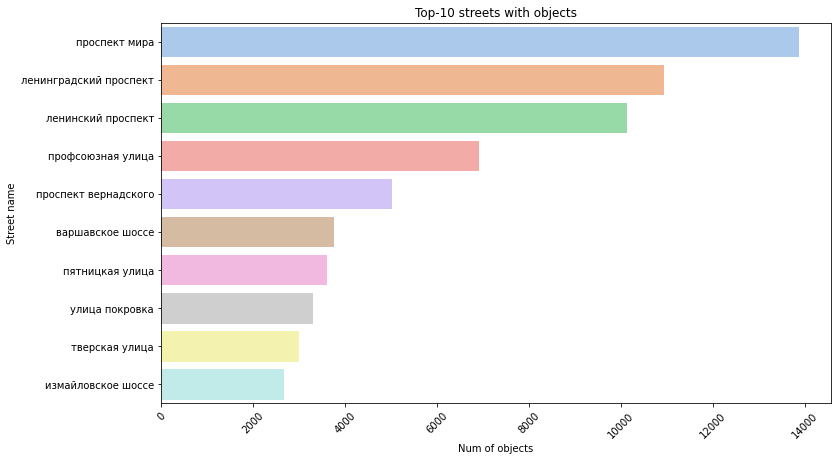

In [41]:
plt.figure(figsize=(12, 7))
street = sns.barplot(x='object_type', y='street', data=top_streets, palette="pastel")
street.set_xlabel('Num of objects')
street.set_ylabel('Street name')
street.set_title('Top-10 streets with objects')
plt.xticks(rotation=45)
plt.show()

In [42]:
top_areas = df.groupby('street').agg({'id':'nunique'}).sort_values(by='id', ascending=False).head(10).index
top_areas = df.query('street in @top_areas').groupby('area').agg({'street':'nunique'}).head(10).reset_index()
top_areas

,area,street
0,Басманный район,5
1,Бескудниковский Район,2
2,Дмитровский район,2
3,Красносельский район,1
4,Лосиноостровский район,2
5,Мещанский район,1
6,Останкинский район,2
7,Район Арбат,4
8,Район Беговой,1
9,Район Богородское,1


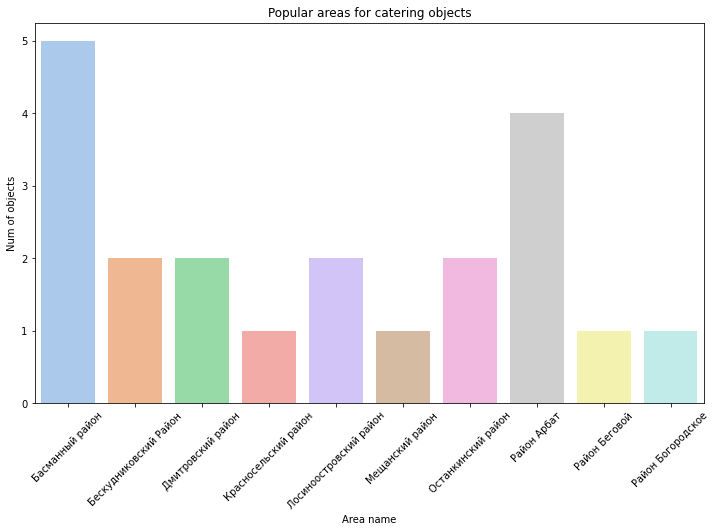

In [43]:
plt.figure(figsize=(12, 7))
streets = sns.barplot(x='area', y='street', data=top_areas, palette="pastel")
streets.set_xlabel('Area name')
streets.set_ylabel('Num of objects')
streets.set_title('Popular areas for catering objects')
plt.xticks(rotation=45)
plt.show()

**Top streets are in districts:**
- Basmanny
- Arbat
- Beskudnikovsky
- Dmitrovsky
- Losinoostrovsky
- Ostankinsky
- Krasnoselsky
- Begovoj
- Meshchansky
- District Bogorodskoe

In [44]:
cafe_top = df[df['object_type'] == 'кафе']
cafe_top = cafe_top.groupby('street').count().sort_values(by='object_type', ascending=False).head(10).reset_index()
cafe_top

,street,id,object_name,chain,object_type,address,number_of_seats,areaid,okrug,area
0,проспект мира,7004,7004,7004,7004,7004,7004,7004,7004,7004
1,ленинградский проспект,4480,4480,4480,4480,4480,4480,4480,4480,4480
2,ленинский проспект,4416,4416,4416,4416,4416,4416,4416,4416,4416
3,профсоюзная улица,3420,3420,3420,3420,3420,3420,3420,3420,3420
4,проспект вернадского,2128,2128,2128,2128,2128,2128,2128,2128,2128
5,пятницкая улица,1980,1980,1980,1980,1980,1980,1980,1980,1980
6,улица покровка,1849,1849,1849,1849,1849,1849,1849,1849,1849
7,варшавское шоссе,1518,1518,1518,1518,1518,1518,1518,1518,1518
8,тверская улица,1496,1496,1496,1496,1496,1496,1496,1496,1496
9,мясницкая улица,1271,1271,1271,1271,1271,1271,1271,1271,1271


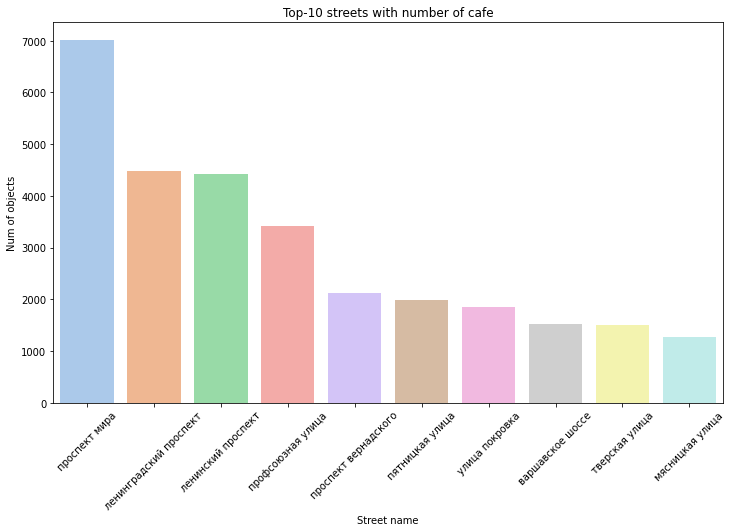

In [45]:
plt.figure(figsize=(12, 7))
cafes = sns.barplot(x='street', y='object_type', data=cafe_top, palette="pastel")
cafes.set_xlabel('Street name')
cafes.set_ylabel('Num of objects')
cafes.set_title('Top-10 streets with number of cafe')
plt.xticks(rotation=45)
plt.show()

### Find the number of streets with one catering facility. Use external information and answer the question - in what districts of Moscow are these streets located?

First, let's find the streets that appear in the table only once

In [46]:
anti_top_streets = df.groupby('street').agg({'id':'nunique'}).sort_values(by='id', ascending=True).head(10).index
anti_top_streets = df.query('street in @anti_top_streets').groupby('area').agg({'street':'nunique'}).head(10).reset_index()
anti_top_streets

,area,street
0,Нагорный район,1
1,Район Лианозово,1
2,Район Матушкино-Савелки,1
3,Район Орехово-Борисово Южное,1


**Conclusion:**

We have only 4 such streets, they are located in the districts:
- Nagorny
- Lianozovo
- Matushkino-Savelki area
- District Orekhovo-Borisovo South

### Look at the distribution of seating for streets with a large number of catering facilities. What patterns can be identified?

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 173656 entries, 0 to 173655
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               173656 non-null  int64  
 1   object_name      173656 non-null  object 
 2   chain            173656 non-null  object 
 3   object_type      173656 non-null  object 
 4   address          173656 non-null  object 
 5   number_of_seats  173656 non-null  int64  
 6   street           143056 non-null  object 
 7   areaid           171329 non-null  float64
 8   okrug            171329 non-null  object 
 9   area             171329 non-null  object 
dtypes: float64(1), int64(2), object(7)
memory usage: 14.6+ MB


In [49]:
top_streets = (df.pivot_table(index = 'street', values = 'object_name', aggfunc = 'count')
               .reset_index()
               .sort_values(by = 'object_name', ascending = False).head(10)
               .rename(columns = {'street':'улица', 'object_name':'количество заведений'}))
places_top_10 = (df.query('street in @top_streets.улица')[['street','number_of_seats', 'object_type']]
                 .rename(columns = {'number_of_seats':'количество посадочных мест', 'object_type':'тип заведения', 'street':'улица'}))
fig = px.box(places_top_10, x='количество посадочных мест', y='улица')
fig.update_layout(title_text='Median number',
                  yaxis_title="",
                  xaxis_title = 'Number of seats')
fig.show()

**Conclusion:**

In general, the number of seats is small. I think this is due to the high price of rent, respectively, the premises are small.

## General conclusion

- The largest number of seats in the dining room
- The largest number of establishments - cafes
- There are 5.5 times more non-network facilities in Moscow than network facilities
- The largest number of chain establishments is fast food, despite this cafe is also found in the top chain establishments, however, they will benefit only due to the number
- Network establishments are characterized by few establishments, but more seats
- The largest number of seats are provided by restaurants and canteens
- The largest number of establishments we have are located mainly in the central regions of Moscow, such as Basmanny, Arbat, etc.
- For streets with a large number of establishments, a small number of seats is typical, I think this is due to the high price of renting a room

**Recommendations**

Since we want to open a cafe, I will give recommendations on this type of catering
- It would be advisable not to rush to open several cafes at once, but to see how one will work. In general, the idea is good, now there are really a lot of cafes on the market, they make up a third of all establishments in Moscow, so an interesting idea is needed to promote a business that would attract people.
- By the number of seats: 30-40 seats, an average of 39 seats in a cafe
- By geography: most of the cafes are located on Prospekt Mira, so I would suggest located on Leninsky Prospekt - it is quite long and there is not much competition there

Presentation: https://disk.yandex.com/d/eeOGIB0GA_2LVg